# **GRAPH NEURAL NETWORKS**


## Overview

The laboratory on GNNs is composed of three parts, with the following contents:
 

1.   Introduction on the session, ubiquity of structured data and graph handling. Utility of GNNs and brief intro.
2.   [The original GNN model ](https://ieeexplore.ieee.org/document/4700287), the GNN framework in PyTorch
3.   Other GNN models (GCN and others), GNN frameworks and DGL usage



# PART I - Introduction and how to handle graphs

### Ubiquity of graph data
Physicochemical Molecule Behaviour  
<img src="https://journals.plos.org/ploscompbiol/article/file?id=10.1371/journal.pcbi.1008504.g003&type=large" height="200">


Traffic Congestion (Estimated Time of Arrival)

<img src="https://d3i71xaburhd42.cloudfront.net/9e2b695d3b6952e4413df659ffdd0f8fb584bcca/2-Figure3-1.png" height="200">


Social Networks Analysis

<img src="https://www.policechiefmagazine.org/wp-content/uploads/Remote-Networking-825x510.jpg" height="200">










## How to handle Graph data

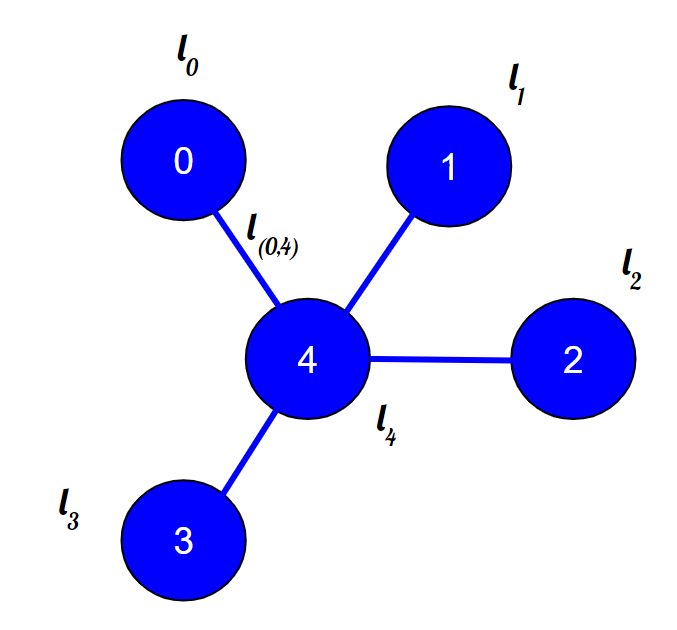


 Graph $G=(V,E)$, where $V$ is a finite set of **nodes** and $E \subseteq V \times V$ collects the **arcs**


Each node could be enriched by some attributes characterizing its properties and nature. In this case, we can talk of an *attributed* graph.  Examples of node features: 

*   Physicochemical characteristics in molecules
*   user preferences in recommendation systems
*   user profile in social networks
*   additionally, when the graph is non-attributed, we can specify some node identifiers 

Specified by:

 $l_i$  node $i$  features $\rightarrow$ global feature matrix $X$ -- (with dimension $N \times d$ if $N$ is the total  nodes number, one row per node).

Also arcs can be characterized by features:
 
 $l_{(i,j)}$ arc $(i,j)$ features





## [NetworkX](https://networkx.org/)

*NetworkX is a Python package for the creation, manipulation, and study of the structure, dynamics, and functions of complex networks*

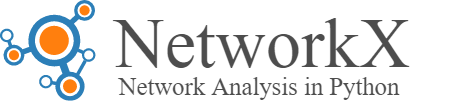

In [1]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

### Graph as Edge List
A graph can be represented through  a list of `[source, destination]` pairs, an **edge-list**.

In [2]:
E = np.asarray([[0, 4], [1, 4], [2, 4], [3, 4]])
E


array([[0, 4],
       [1, 4],
       [2, 4],
       [3, 4]])

We can give such list `E` as an input to the Networkx Graph class `nx.Graph()` -  the following snippet contains the graph creation and plotting using a common layout (spring).

/home/joris/.local/lib/python3.10/site-packages/networkx/drawing/nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


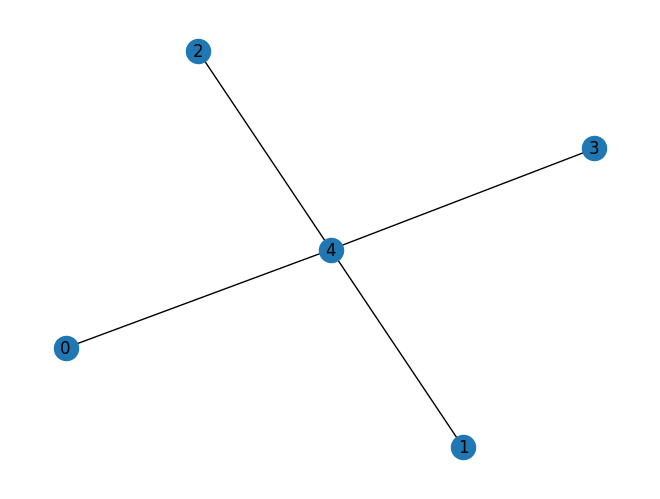

In [3]:
G = nx.Graph()
G.add_nodes_from(range(5)) # node indices
G.add_edges_from(E) # edge list given as input to the graph G
nx.draw_spring(G, cmap=plt.get_cmap('Set1'), with_labels=True)
plt.show()


### Adjancency Matrix

The  Adjancency Matrix is compact way in which is possible to describe the graph topology. It consists in a square matrix ($N \times N$) which elements indicate whether pairs of vertices are adjacent or not in the graph.

$a_{i,j} = \begin{cases} 1 & (i, j) \in E \\
0  & \text{else}
\end{cases}
$

In [4]:
A = nx.adjacency_matrix(G)
print(A.todense())

[[0 0 0 0 1]
 [0 0 0 0 1]
 [0 0 0 0 1]
 [0 0 0 0 1]
 [1 1 1 1 0]]


/tmp/ipykernel_67511/960885711.py:1: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(G)


### Other Example

Another  graph example.

/home/joris/.local/lib/python3.10/site-packages/networkx/drawing/nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


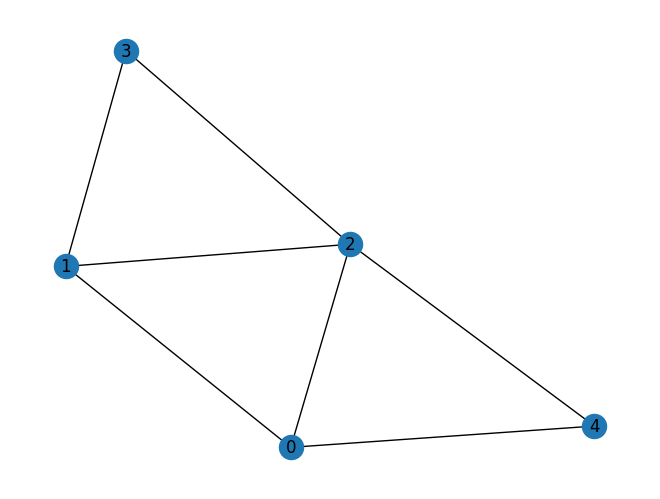

[[0 1 1 0 1]
 [1 0 1 1 0]
 [1 1 0 1 1]
 [0 1 1 0 0]
 [1 0 1 0 0]]


/tmp/ipykernel_67511/966020271.py:7: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A2 = nx.adjacency_matrix(G2)


In [5]:
E2 = np.asarray([[0, 1 ], [0,2 ], [0, 4 ], [1, 2 ], [1, 3 ], [2, 3 ], [2, 4 ]])
G2 = nx.Graph()
G2.add_nodes_from(range(5)) # node indices
G2.add_edges_from(E2) # edge list
nx.draw_spring(G2, cmap=plt.get_cmap('Set1'), with_labels=True)
plt.show()
A2 = nx.adjacency_matrix(G2)
print(A2.todense())

## Node attributes

We can specify the node attributes using a $N \times d$ matrix, where $d$ is the node feature dimension. The following snippet contains the node feature definition as one-hot codes (each node is identified by a different one-hot code). 



In [6]:
#node features
X = np.eye(4)
print(X)

[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]


## Part I.a - Graph Neural Networks

#### Traditional machine learning

*  ML approaches assume to deal with **flat data**
*  Flat representations relying on summary graph statistics,  kernel functions, graph traversals procedures etc.

*  *Pre-processing step*, using hand-engineered statistics to extract structural information into simpler encodings
*   Limited approaches -- loosing useful information, not able to adapt during learning






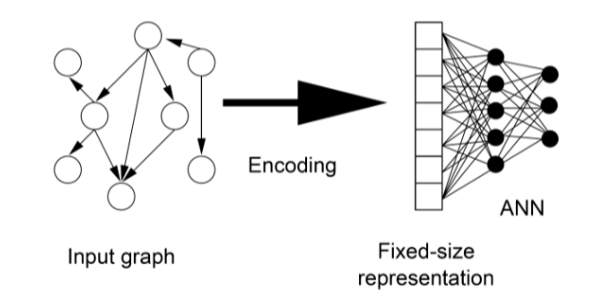

### GNNs 


1.  No need of a preprocessing embedding step
2.  No limitation on the graph type
3.  Neural networks exploited to learn how to encode nodes of a graph for a given task
4.  Take into account information local to each node and the whole graph topology




### Timeline of GNN models



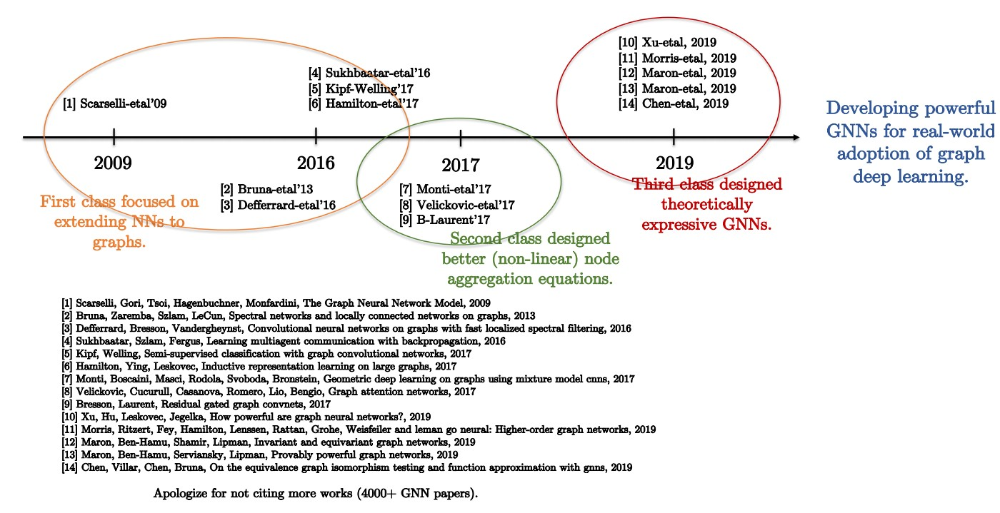

[A Comprehensive Survey on Graph Neural Networks](https://arxiv.org/pdf/1901.00596.pdf)

###  A usefull (and powerfull) paradigm: Message Passing Models
It is the most powerfull and generic model description of GNNs. Based on message exchange among neighbors. Many GNN models can be described using this formalism. It help understanding how the information propagates inside the graph.



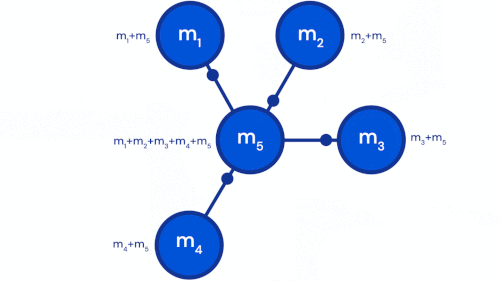

## Learning Tasks

Given an input graph (or graph dataset), GNNs can attack various types of tasks.



*   **Node classification** - produce an output class for each node in the processed graph  (atom level in a molecule )
*   **Graph classification** - produce a single output for the whole graph 
*   **Link prediction** - predict wheter there is an arc between two unseen nodes



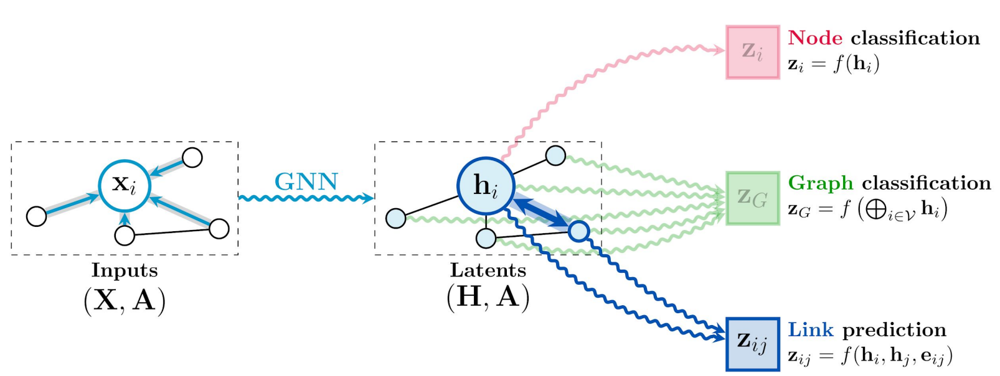

## Available Frameworks 
Avoid the boiler plate of model implementation, they provide many ready to use  GNN models (in Tensorflow, PyTorch, etc.)

- [GNN Framework ](http://sailab.diism.unisi.it/gnn/)
- [Deep Graph Library ](https://www.dgl.ai/)
- [PyTorch Geometric ](https://pytorch-geometric.readthedocs.io/en/latest/)


And many others!

## Available Datasets


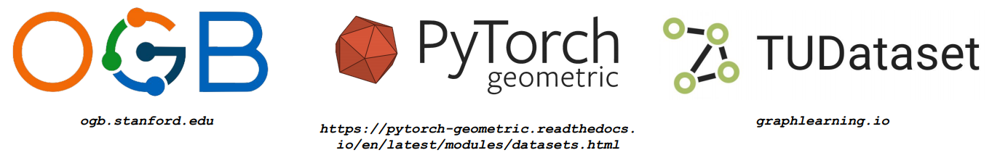

# Part II: GNN models - Graph Convolutional Nets and more

## Message Passing Neural Network 
Describe the models under a common framework ( [by Gilmer et al. 2017](https://arxiv.org/abs/1704.01212))

- Minimal requirements to design  a message passing node aggregation function
  - Permutation invariance
  - Independent on neighborhood size (**1-hop**)
  - Exploit same aggregation function  among the nodes (gain generalization)
  - Linear complexity on the Edges

- MPNN are the most powerfull GNNs model - maximum expressivity, possible to describe all the models under this framework!






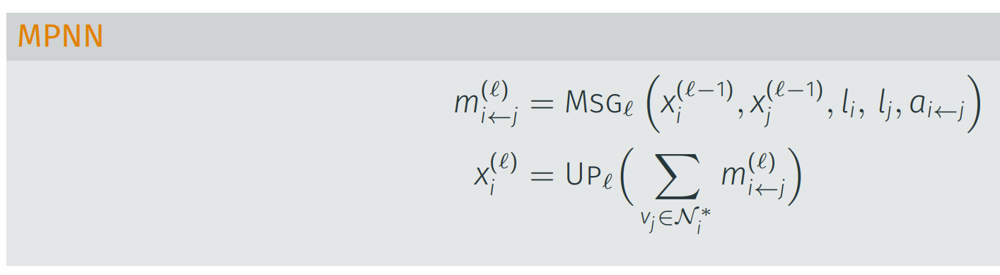

## PART III.a - Graph Convolutional Networks




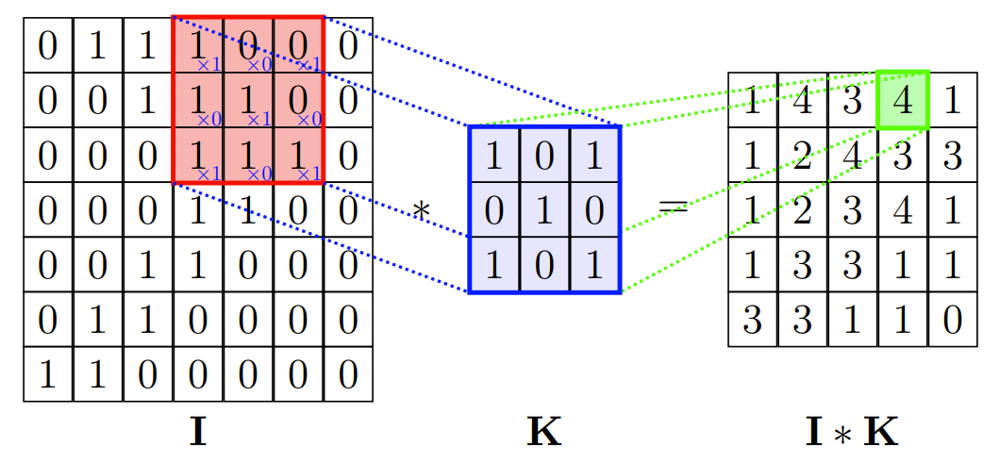

Inspired by the operation of *convolutions* on images (CNNs).

A simpler node feature update rule than general message passing 
- Aggregate neighbourhoods using the adjancency matrix  $A$

$a_{i,j} = \begin{cases} 1 & (i, j) \in E \\
0  & \text{else}
\end{cases}
$
 


#### GCN update rule

$ H^{\ell +1} = \sigma (AH^{\ell}W^{\ell})$, with $\ell \in \{0,1,..., n\}$

where $H^0$ are the node initial features that are updated by stacking many aggregaton layers, and $W^{\ell}$ is a learnable node-wise shared linear transformation, $\sigma$ is a non-linearity. 


Node-wise update: 
$h_i' = \sigma(\sum_{j \in N_i} Wh_j)$ 

- Better consider also the node itself in the update rule:
$\hat{A}= A + I $

- Normalize with the size of the neighboorhood :
  - Degree Matrix $\hat{D}_{ii} = \sum_j \hat{A}_{ij}$



- $ H^{\ell +1} = \sigma (\hat{D}^{-1}AH^{\ell}W)$,


- Node-wise update:

 - $h_i' = \sigma(\sum_{j \in N_i} \frac{1}{|N_i|} Wh_j)$   

#### GCN update rule
Simmetric normalization 
 - $ H^{\ell +1} = \sigma (\hat{D}^{-1/2}\hat{A}\hat{D}^{-1/2}H^{\ell}W^{\ell})$,

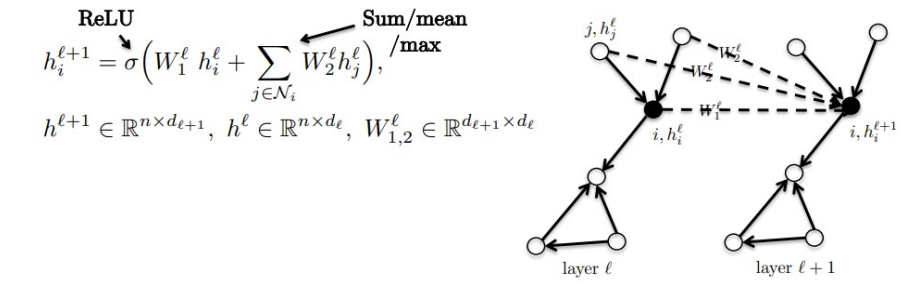

Layered structure $\rightarrow$ depth foster aggregation

####  Isotropic GNN
- In the aggregation phase, every neighbor contributes equally aggregation
  -  [ GCN](https://arxiv.org/abs/1609.02907)
  -  [GraphSAGE](https://papers.nips.cc/paper/2017/file/5dd9db5e033da9c6fb5ba83c7a7ebea9-Paper.pdf) 
  - Every direction is **treated in the same way**

### Anisotropic GNN  (attentional models)
-  Gaining a **directional structure**
-  How:
  - Adding **Edge Features if available**
  - **Learn anisotropy** to treat neighbors differently 
    - [Graph Attention Networks](https://arxiv.org/abs/1710.10903)
    - [MoNet](https://arxiv.org/abs/1611.08402)

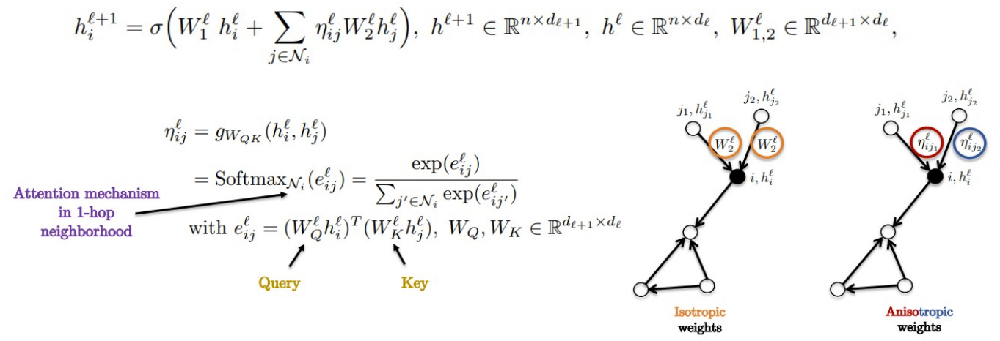

## Part III.b - GNN frameworks



### Available Frameworks 
Avoid the boiler plate of model implementation, they provide many ready to use  GNN models (in Tensorflow, PyTorch, etc.)

- [GNN Framework ](http://sailab.diism.unisi.it/gnn/)
- [Deep Graph Library ](https://www.dgl.ai/)
- [PyTorch Geometric ](https://pytorch-geometric.readthedocs.io/en/latest/)


And many others!

### Available Datasets


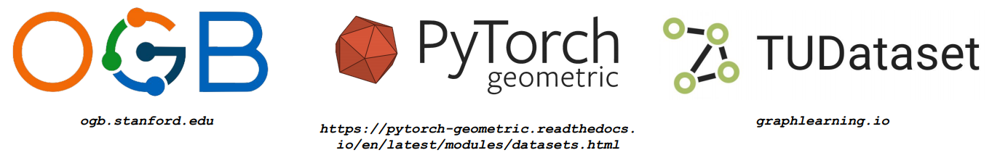

## Part III.c - Deep Graph Library (DGL)
- Handles large scale/real world graphs - **batching, multiprocess, distributed**
- Framework agnostic (PyTorch, TF, MXNet)
- Many GNNs models ready-to-go **ConvGNNs** - GCN, GAT, GIN, GraphSAGE, etc. )
- **Dataloaders** for Open Graph Benchmark (OGB) and many other classic graph benchmarks


### DGL usage example: The Zachary’s karate club (node focused-task)

In [7]:
# !pip install dgl

In [8]:
import dgl
import numpy as np
import networkx as nx
from dgl.data import KarateClubDataset


import torch
import torch.nn as nn
import torch.nn.functional as F

kc = KarateClubDataset()

DGL backend not selected or invalid.  Assuming PyTorch for now.


Setting the default backend to "pytorch". You can change it in the ~/.dgl/config.json file or export the DGLBACKEND environment variable.  Valid options are: pytorch, mxnet, tensorflow (all lowercase)


/home/joris/.local/lib/python3.10/site-packages/dgl/data/utils.py:288: UserWarning: Property dataset.data will be deprecated, please use dataset[0] instead.
  warnings.warn('Property {} will be deprecated, please use {} instead.'.format(old, new))


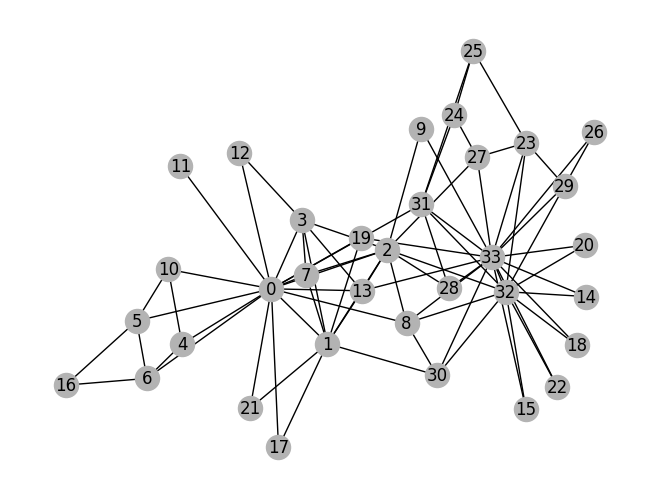

In [25]:
nx_G =kc.data[0].to_networkx().to_undirected()
# Kamada-Kawaii layout usually looks pretty for arbitrary graphs
pos = nx.spring_layout(nx_G)
nx.draw(nx_G, pos, with_labels=True, node_color=[[.7, .7, .7]])

In [10]:
G = kc.data[0]
G.ndata['feat'] = torch.eye(34)

In [11]:
G.ndata['feat'].shape

torch.Size([34, 34])

Import the Graph Convolution operation implemented in  DGL

In [12]:
from dgl.nn.pytorch import GraphConv

In [32]:
class GCN(nn.Module):
  def __init__(self, in_feats, hidden_size, num_classes):
    super(GCN, self).__init__()
    self.conv1 = GraphConv(in_feats, hidden_size)
    self.conv2 = GraphConv(hidden_size, num_classes)

  def forward(self, g, inputs):
    h = self.conv1(g, inputs)
    h = torch.relu(h)
    h = self.conv2(g, h)
    return h


# The first layer transforms input features of size of 5 to a hidden size of 10.
# The second layer transforms the hidden layer and produces output features of
# size 2, corresponding to the two groups of the karate club.
net = GCN(in_feats=34, hidden_size=10, num_classes=2)


In [33]:
inputs = G.ndata['feat']
labeled_nodes = torch.tensor([0, 33])  # only the instructor and the president nodes are labeled
labels = G.ndata['label']
unlabeled_nodes = torch.tensor(range(1,33))

In [34]:
all_logits = []
optimizer = torch.optim.Adam(net.parameters(), lr=0.01)
for epoch in range(200):
    logits = net(G, inputs)
    # we save the logits for visualization later
    all_logits.append(logits.detach())
    logp = F.log_softmax(logits, 1)
    # we only compute loss for labeled nodes
    loss = F.nll_loss(logp[labeled_nodes], labels[labeled_nodes])
    loss_unlabeled = F.nll_loss(logp[unlabeled_nodes], labels[unlabeled_nodes])


    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    print('Epoch %d | Loss: %.4f  |  Loss Test: %.4f' % (epoch, loss.item(), loss_unlabeled.item()))

Epoch 0 | Loss: 0.6572  |  Loss Test: 0.6849
Epoch 1 | Loss: 0.6388  |  Loss Test: 0.6785
Epoch 2 | Loss: 0.6201  |  Loss Test: 0.6720
Epoch 3 | Loss: 0.6010  |  Loss Test: 0.6655
Epoch 4 | Loss: 0.5794  |  Loss Test: 0.6586
Epoch 5 | Loss: 0.5574  |  Loss Test: 0.6510
Epoch 6 | Loss: 0.5352  |  Loss Test: 0.6425
Epoch 7 | Loss: 0.5125  |  Loss Test: 0.6334
Epoch 8 | Loss: 0.4896  |  Loss Test: 0.6236
Epoch 9 | Loss: 0.4682  |  Loss Test: 0.6133
Epoch 10 | Loss: 0.4458  |  Loss Test: 0.6022
Epoch 11 | Loss: 0.4225  |  Loss Test: 0.5905
Epoch 12 | Loss: 0.3985  |  Loss Test: 0.5781
Epoch 13 | Loss: 0.3742  |  Loss Test: 0.5654
Epoch 14 | Loss: 0.3498  |  Loss Test: 0.5523
Epoch 15 | Loss: 0.3256  |  Loss Test: 0.5389
Epoch 16 | Loss: 0.3019  |  Loss Test: 0.5250
Epoch 17 | Loss: 0.2789  |  Loss Test: 0.5113
Epoch 18 | Loss: 0.2564  |  Loss Test: 0.4972
Epoch 19 | Loss: 0.2348  |  Loss Test: 0.4831
Epoch 20 | Loss: 0.2142  |  Loss Test: 0.4692
Epoch 21 | Loss: 0.1947  |  Loss Test: 0.455

In [35]:
import matplotlib.animation as animation
import matplotlib.pyplot as plt

def draw(i):
    cls1color = '#00FFFF'
    cls2color = '#FF00FF'
    pos = {}
    colors = []
    for v in range(34):
        pos[v] = all_logits[i][v].numpy()
        cls = pos[v].argmax()
        colors.append(cls1color if cls else cls2color)
    ax.cla()
    ax.axis('off')
    ax.set_title('Epoch: %d' % i)
    nx.draw_networkx(nx_G.to_undirected(), pos, node_color=colors,
            with_labels=True, node_size=300, ax=ax)

fig = plt.figure(dpi=150)
fig.clf()
ax = fig.subplots()
draw(0)  # draw the prediction of the first epoch
plt.close()

In [36]:
from matplotlib import rc
rc('animation', html='jshtml')
ani = animation.FuncAnimation(fig, draw, frames=len(all_logits), interval=200)

In [37]:
ani

### Graph Classification (graph-focused task) and batching usign DGL

[The example](https://docs.dgl.ai/en/0.6.x/tutorials/basics/4_batch.html) task objective is to classify eight types of topologies shown here.

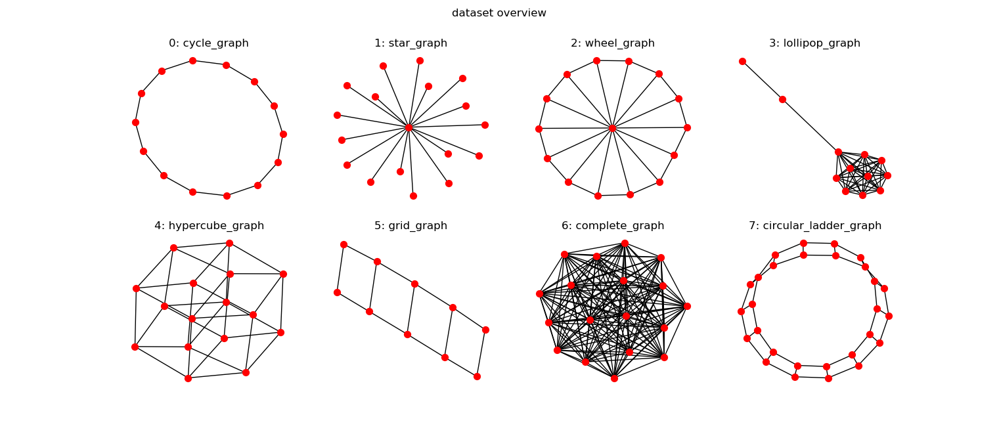

In [19]:
!pip install dgl

Defaulting to user installation because normal site-packages is not writeable


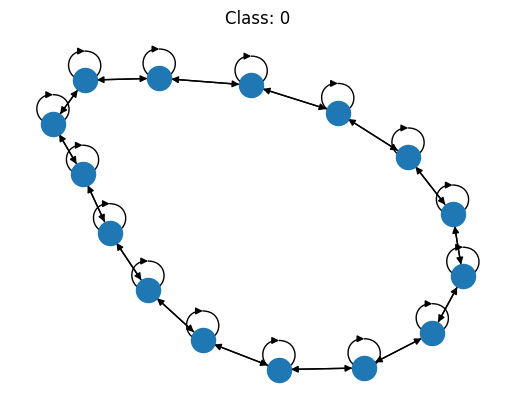

In [38]:
from dgl.data import MiniGCDataset
import matplotlib.pyplot as plt
import networkx as nx

# A dataset with 80 samples, each graph is
# of size [10, 20]
dataset = MiniGCDataset(80, 10, 20)
graph, label = dataset[0]
fig, ax = plt.subplots()
nx.draw(graph.to_networkx(), ax=ax)
ax.set_title("Class: {:d}".format(label))
plt.show()


To train neural networks efficiently, a common practice is to batch multiple samples together to form a mini-batch.  To address this, DGL provides a dgl.batch() API. It leverages the idea that a batch of graphs can be viewed as a large graph that has many disjointed connected components.

In [39]:
import dgl
import torch

def collate(samples):
    # The input `samples` is a list of pairs
    #  (graph, label).
    graphs, labels = map(list, zip(*samples))
    batched_graph = dgl.batch(graphs)
    return batched_graph, torch.tensor(labels)

In [40]:
from dgl.nn.pytorch import GraphConv

#### Graph readout

In order to make a single prediction fot the whole graph, one usually aggregates and summarizes over the possibly abundant information. This type of operation is named **readout**. 
- Common readout operations include summation, average, maximum or minimum over all node or edge features.

- $h_g=\frac{1}{|\mathcal{V}|}\sum_{v\in\mathcal{V}}h_{v}$


In DGL,` dgl.mean_nodes() `handles this task for a batch of graphs with variable size. You then feed the graph representations into a classifier with one linear layer to obtain pre-softmax logits.



In [41]:
import torch.nn as nn
import torch.nn.functional as F

class Classifier(nn.Module):
    def __init__(self, in_dim, hidden_dim, n_classes):
        super(Classifier, self).__init__()
        self.conv1 = GraphConv(in_dim, hidden_dim)
        self.conv2 = GraphConv(hidden_dim, hidden_dim)
        self.classify = nn.Linear(hidden_dim, n_classes)

    def forward(self, g):
        # Use node degree as the initial node feature. For undirected graphs, the in-degree
        # is the same as the out_degree.
        h = g.in_degrees().view(-1, 1).float()
        # Perform graph convolution and activation function.
        h = F.relu(self.conv1(g, h))
        h = F.relu(self.conv2(g, h))
        g.ndata['h'] = h
        # Calculate graph representation by averaging all the node representations.
        hg = dgl.mean_nodes(g, 'h')
        return self.classify(hg)

Create a synthetic dataset of 400 graphs with 10 ~ 20 nodes. 320 graphs constitute a training set and 80 graphs constitute a test set.

In [42]:
import torch.optim as optim
from torch.utils.data import DataLoader

# Create training and test sets.
trainset = MiniGCDataset(320, 10, 20)
testset = MiniGCDataset(80, 10, 20)
# Use PyTorch's DataLoader and the collate function
# defined before.
data_loader = DataLoader(trainset, batch_size=32, shuffle=True,
                         collate_fn=collate)

# Create model
model = Classifier(1, 512, trainset.num_classes)
loss_func = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
model.train()

epoch_losses = []
for epoch in range(200):
    epoch_loss = 0
    for iter, (bg, label) in enumerate(data_loader):
        prediction = model(bg)
        loss = loss_func(prediction, label)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.detach().item()
    epoch_loss /= (iter + 1)
    print('Epoch {}, loss {:.4f}'.format(epoch, epoch_loss))
    epoch_losses.append(epoch_loss)

Epoch 0, loss 2.0113
Epoch 1, loss 1.9880
Epoch 2, loss 1.9653
Epoch 3, loss 1.9490
Epoch 4, loss 1.9188
Epoch 5, loss 1.8915
Epoch 6, loss 1.8421
Epoch 7, loss 1.7830
Epoch 8, loss 1.7054
Epoch 9, loss 1.6252
Epoch 10, loss 1.5363
Epoch 11, loss 1.4569
Epoch 12, loss 1.3645
Epoch 13, loss 1.2779
Epoch 14, loss 1.2072
Epoch 15, loss 1.1601
Epoch 16, loss 1.0913
Epoch 17, loss 1.0568
Epoch 18, loss 1.0339
Epoch 19, loss 0.9923
Epoch 20, loss 0.9522
Epoch 21, loss 0.9132
Epoch 22, loss 0.9424
Epoch 23, loss 0.9132
Epoch 24, loss 0.8689
Epoch 25, loss 0.8680
Epoch 26, loss 0.8477
Epoch 27, loss 0.8313
Epoch 28, loss 0.8185
Epoch 29, loss 0.8116
Epoch 30, loss 0.8466
Epoch 31, loss 0.8184
Epoch 32, loss 0.7938
Epoch 33, loss 0.7805
Epoch 34, loss 0.7635
Epoch 35, loss 0.7860
Epoch 36, loss 0.7641
Epoch 37, loss 0.7540
Epoch 38, loss 0.7363
Epoch 39, loss 0.7423
Epoch 40, loss 0.7708
Epoch 41, loss 0.7716
Epoch 42, loss 0.7247
Epoch 43, loss 0.7245
Epoch 44, loss 0.7073
Epoch 45, loss 0.720

Let's test the obtained model!

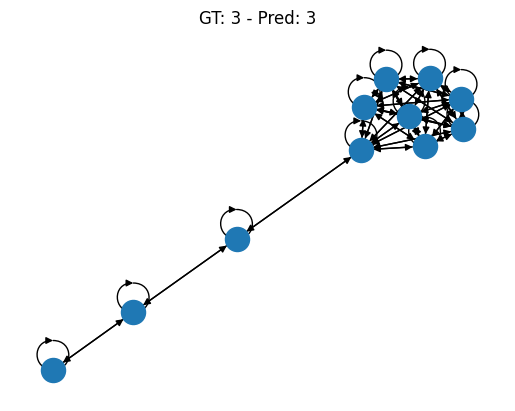

In [43]:
pick_a_graph, label_pick = testset[35]
prediction = model(pick_a_graph)

fig, ax = plt.subplots()
nx.draw(pick_a_graph.to_networkx(), ax=ax)
ax.set_title(f'GT: {label_pick} - Pred: {prediction.argmax().numpy()}')
plt.show()

In [44]:
prediction

tensor([[-128.6444,  -17.4745,    4.6660,   11.7296,   -5.8009,   -8.3545,
           -7.0288,  -53.8725]], grad_fn=<AddmmBackward0>)

### **Link prediction usign DGL**

#### Introduction

Another application that can be achieved using GNNs is the **link prediction problem**. This part is based on the [example](https://docs.dgl.ai/en/0.6.x/guide/training-link.html) and [SEAL](https://papers.nips.cc/paper/2018/file/53f0d7c537d99b3824f0f99d62ea2428-Paper.pdf). \
Given a Graph, the task consists of predicting whether a link between two nodes **u** and **v** exists or not. This comes to calculate the likelihood of connectivity between these two nodes using the GNN node representation.

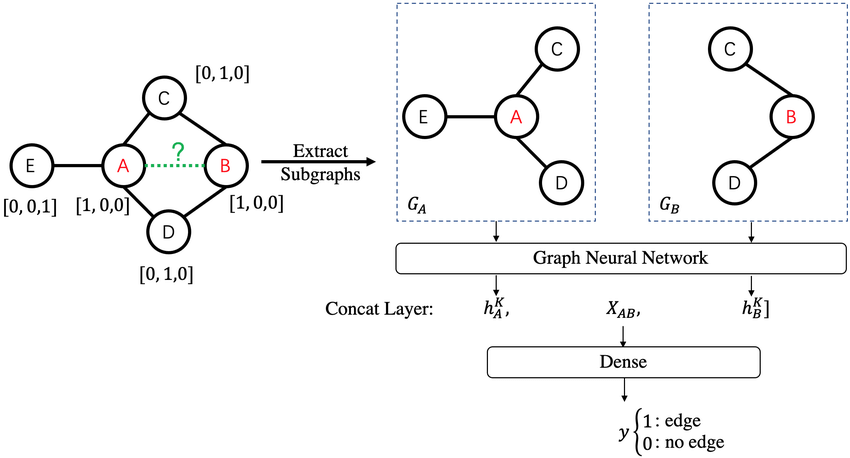

We define the score $y_{u,v}$ which is defined as : \\
$$y_{u,v} = \phi(h^{L}_{u}, h^{L}_{v})$$
Where : $h^{L}_{u}$ and $h^{L}_{v}$ are the GNN representation of node **u** and node **v** respectively. \\

The idea is to compare the score obtained from a pair of nodes connected by an edge against the scores between an arbitrary pair of nodes. The goal is to have a high score for connected pairs (ideally 1) and a low score for unconnected pairs (ideally 0). There are lots of loss functions that can achieve the behavior above if minimized, such as Cross entropy loss, BPR loss, Margin loss...

#### Overview of the training process


So, to train the link predictor model, we follow the steps listed below :

1.   Treat the edges of the model as positive examples and give them the label of 1.
2.   Sample the same number of non-existent edges (node pairs with no edges between them) as negative examples and give them the label 0.
3.   Divide the positive examples and negative examples into a training set and a test set.
4.   Define the GNN model.
5.   Use the GNN to compute the representation $h$ for each node in the graph. Then, For each example (pair of nodes), use the node representation to compute a score using the function $\phi$ which can be a simple dot product between the two representations.
6.   Given the computed scores, evaluate the model with any binary classification metric such as Area Under Curve (AUC).



#### Link prediction on **Cora** dataset
The [Cora](https://relational.fit.cvut.cz/dataset/CORA) consists of 2708 scientific publications. The citation network consists of 5429 links. Each publication in the dataset is described by a 0/1-valued word vector indicating the absence/presence of the corresponding word from the dictionary. The dictionary consists of 1433 unique words. \\
The task is : "*given two scientific publications, predict whether one has cited the other*". 

In [ ]:
# !pip install dgl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [45]:
import dgl
import torch
import torch.nn as nn
import torch.nn.functional as F
import itertools
import numpy as np
import scipy.sparse as sp

First, we retrieve the dataset.

In [46]:
import dgl.data

dataset = dgl.data.CoraGraphDataset()
g = dataset[0]

Extracting file to /home/joris/.dgl/cora_v2
Finished data loading and preprocessing.
  NumNodes: 2708
  NumEdges: 10556
  NumFeats: 1433
  NumClasses: 7
  NumTrainingSamples: 140
  NumValidationSamples: 500
  NumTestSamples: 1000
Done saving data into cached files.


We prepare the training and testing sets by randomly picking 10% of the edges for positive examples in the test set, and the rest will be used as a training set. We then sample the same number of edges for negative examples in both sets.

In [48]:
# ----------- 2. process data -------------- #
# Split edge set for training and testing
u, v = g.edges()

eids = np.arange(g.number_of_edges())
eids = np.random.permutation(eids)
test_size = int(len(eids) * 0.1)
train_size = g.number_of_edges() - test_size
test_pos_u, test_pos_v = u[eids[:test_size]], v[eids[:test_size]]
train_pos_u, train_pos_v = u[eids[test_size:]], v[eids[test_size:]]

# Find all negative edges and split them for training and testing
adj = sp.coo_matrix((np.ones(len(u)), (u.numpy(), v.numpy())))
adj_neg = 1 - adj.todense() - np.eye(g.number_of_nodes())
neg_u, neg_v = np.where(adj_neg != 0)

neg_eids = np.random.choice(len(neg_u), g.number_of_edges() // 2)
test_neg_u, test_neg_v = neg_u[neg_eids[:test_size]], neg_v[neg_eids[:test_size]]
train_neg_u, train_neg_v = neg_u[neg_eids[test_size:]], neg_v[neg_eids[test_size:]]


We remove the edges used in testing set from the original garph.

In [49]:
train_g = dgl.remove_edges(g, eids[:test_size])

We then define the GNN model which consists of two [GraphSage](https://arxiv.org/abs/1706.02216) layers. 

In [50]:
from dgl.nn import SAGEConv

# ----------- 3. create model -------------- #
# build a two-layer GraphSAGE model
class GraphSAGE(nn.Module):
    def __init__(self, in_feats, h_feats):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(in_feats, h_feats, 'mean')
        self.conv2 = SAGEConv(h_feats, h_feats, 'mean')

    def forward(self, g, in_feat):
        h = self.conv1(g, in_feat)
        h = F.relu(h)
        h = self.conv2(g, h)
        return h

Now that we can compute the representation $h$ for each node in the graph, we define the score function $\phi$ which will consist of a dot product between the representations of two nodes. You can construct a more complex $\phi$ function such as an MLP.  

In [51]:
import dgl.function as fn

class DotPredictor(nn.Module):
    def forward(self, g, h):
        with g.local_scope():
            g.ndata['h'] = h
            # Compute a new edge feature named 'score' by a dot-product between the
            # source node feature 'h' and destination node feature 'h'.
            g.apply_edges(fn.u_dot_v('h', 'h', 'score'))
            # u_dot_v returns a 1-element vector for each edge so you need to squeeze it.
            return g.edata['score'][:, 0]

We are almost done. We need just to define the positive and negative examples as the following :



In [52]:
train_pos_g = dgl.graph((train_pos_u, train_pos_v), num_nodes=g.number_of_nodes())
train_neg_g = dgl.graph((train_neg_u, train_neg_v), num_nodes=g.number_of_nodes())

test_pos_g = dgl.graph((test_pos_u, test_pos_v), num_nodes=g.number_of_nodes())
test_neg_g = dgl.graph((test_neg_u, test_neg_v), num_nodes=g.number_of_nodes())

Before we go to the training loop, we need to define the loss function. For that, we will use the binary cross entropy loss for training and AUC for testing.

In [53]:
from sklearn.metrics import roc_auc_score


def compute_loss(pos_score, neg_score):
  scores = torch.cat([pos_score, neg_score])
  labels = torch.cat([torch.ones(pos_score.shape[0]), torch.zeros(neg_score.shape[0])])
  return F.binary_cross_entropy_with_logits(scores, labels)


def compute_auc(pos_score, neg_score):
  scores = torch.cat([pos_score, neg_score]).numpy()
  labels = torch.cat(
    [torch.ones(pos_score.shape[0]), torch.zeros(neg_score.shape[0])]
  ).numpy()
  return roc_auc_score(labels, scores)


Now that we have defined all what we need, we can jump to the training loop.

In [54]:
model = GraphSAGE(train_g.ndata['feat'].shape[1], 16)
pred = DotPredictor()

optimizer = torch.optim.Adam(itertools.chain(model.parameters(), pred.parameters()), lr=0.01)

# ----------- 4. training -------------------------------- #
all_logits = []
for e in range(100):
    # forward
    h = model(train_g, train_g.ndata['feat'])
    pos_score = pred(train_pos_g, h)
    neg_score = pred(train_neg_g, h)
    loss = compute_loss(pos_score, neg_score)

    # backward
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if e % 5 == 0:
        print('In epoch {}, loss: {}'.format(e, loss))

# ----------- 5. check results ------------------------ #
from sklearn.metrics import roc_auc_score
with torch.no_grad():
    pos_score = pred(test_pos_g, h)
    neg_score = pred(test_neg_g, h)
    print('AUC', compute_auc(pos_score, neg_score))

In epoch 0, loss: 0.6921072006225586
In epoch 5, loss: 0.6059004664421082
In epoch 10, loss: 0.5862175226211548
In epoch 15, loss: 0.5569503307342529
In epoch 20, loss: 0.5047505497932434
In epoch 25, loss: 0.450168639421463
In epoch 30, loss: 0.4044639468193054
In epoch 35, loss: 0.3617289662361145
In epoch 40, loss: 0.3354569673538208
In epoch 45, loss: 0.30702441930770874
In epoch 50, loss: 0.2806927561759949
In epoch 55, loss: 0.25781702995300293
In epoch 60, loss: 0.23652607202529907
In epoch 65, loss: 0.2164190262556076
In epoch 70, loss: 0.196173295378685
In epoch 75, loss: 0.17714133858680725
In epoch 80, loss: 0.15880127251148224
In epoch 85, loss: 0.141071617603302
In epoch 90, loss: 0.1240411177277565
In epoch 95, loss: 0.1078137680888176
AUC 0.857004110419802
